____Задание для итоговой аттестации____

Для решения итогового проекта выберете наиболее подходящий для вас датасет из [списка.](https://view.officeapps.live.com/op/view.aspx?src=https%3A%2F%2Fcdn.1t.ru%2F24%2FData_Scientist%2F%25D0%25A4%25D0%25B0%25D0%25B9%25D0%25BB%25D1%258B%2Fexercise%2F%25D0%25B7%25D0%25B0%25D0%25B4%25D0%25B0%25D0%25BD%25D0%25B8%25D1%258F%2520%25D0%25B4%25D0%25BB%25D1%258F%2520%25D0%25B8%25D1%2582%25D0%25BE%25D0%25B3%25D0%25BE%25D0%25B2%25D0%25BE%25D0%25B9%2520%25D0%25B0%25D1%2582%25D1%2582%25D0%25B5%25D1%2581%25D1%2582%25D0%25B0%25D1%2586%25D0%25B8%25D0%25B8.docx&wdOrigin=BROWSELINK)

Выбран № 13

[Датасет](https://www.kaggle.com/datasets/dansbecker/new-york-city-taxi-fare-prediction ) содержит информацию о поездках в такси в городе Нью-Йорк. 

Ваша задача построить модель для предсказания цены тарифа на такси.

Целевая переменная <span style="color: orange; font-weight:">fare_amount</span>

Рекомендации:

 - Соблюдайте PEP8

 - Комментируйте код в местах, где конструкция большая

 - Оставляйте промежуточные выводы по вашему исследованию и построению модели (так кураторам будет проще понять ваши заключения)

 - Экспериментируйте! Вы не ограничены в моделях и подходах. Можете использовать любые DS инструменты (и те, которые мы не разбирали с вами на курсе)

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from summarytools import dfSummary
import plotly.express as px
import re
import folium
from folium.plugins import HeatMap
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
from math import radians, cos, sin, sqrt, asin
from scipy import stats
from tabulate import tabulate
from plotnine import ggplot, aes, geom_line, geom_point, labs, theme, element_text

Pipeline выполнения задачи:

1.      - Загрузка и предобработка данных

In [2]:
df = pd.read_csv('taxi.csv')
# Переименуем названия столбцов в соответствии с PEP8
df.columns = [re.sub('(?<!^)(?=[A-Z])|[ ]', '_', i, count=1).lower() for i in df.columns]
df.sample(5)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
19059,2013-12-06 14:35:00.000000202,47.5,2013-12-06 14:35:00 UTC,-73.782275,40.644647,-73.988652,40.667090,1
17580,2011-11-02 14:08:06.0000001,7.7,2011-11-02 14:08:06 UTC,-73.991619,40.744844,-74.001743,40.729834,1
40558,2012-06-03 08:22:00.0000009,5.3,2012-06-03 08:22:00 UTC,-73.984178,40.762470,-73.973070,40.757465,5
3407,2009-03-15 14:02:16.0000001,4.5,2009-03-15 14:02:16 UTC,-73.999519,40.733535,-73.990233,40.734611,1
38849,2013-11-30 12:22:42.0000004,11.5,2013-11-30 12:22:42 UTC,-73.952294,40.777417,-73.982527,40.738521,1


2.      - Описательный анализ данных, просмотр данных и вывод статистики

In [3]:
dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,key[object],1. 2009-06-15 17:26:21.00000012. 2013-01-18 14:21:00.0000002043. 2013-03-07 13:04:11.00000014. 2011-09-07 20:51:52.00000015. 2012-09-14 20:07:00.0000001036. 2014-04-20 13:04:00.000000837. 2014-10-31 13:49:01.00000038. 2014-12-18 21:43:00.0000002429. 2015-02-09 13:07:30.000000110. 2010-10-06 14:34:00.0000002911. other,"1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)1 (0.0%)49,990 (100.0%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAD+CAYAAAAtWHdlAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAADLklEQVR4nO3cwY3TYBRG0ecogmFja2QpJUAPKYItvdOFNzCswoIeriVzTgX/4kpPkfxleb1eA4Xb2Q/g/yE2MmIjIzYyYiMjNjJiIyM2MmIjIzYyt2VZvi3L8nb2Q7i+28x8nZnPZz+E63NGyYiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI3MbWZ+zsyfsx/C9S3+xYiKM0pGbGSsq8hYV5FxRsmIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyBi8kDF4IeOMkhEbGYMXMgYvZJxRMmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyBi9kDF7IOKNkxEZGbGSsq8hYV5FxRsmIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyFhXkbGuIuOMkhEbGYMXMgYvZJxRMmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyBi9kDF7IOKNkxEbG4IWMwQsZZ5SM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyFhXkbGuIuOMkhEbGesqMtZVZJxRMmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyBi9kDF7IOKNkxEbG4IWMwQsZZ5SM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzBCxmDFzLOKBmxkREbGesqMtZVZJxRMmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYy1lVkrKvIOKNkxEbG4IWMwQsZZ5SM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzBCxmDFzLOKJllZr7MzKezH8L13fd9/76u6/vZD+H67uu6vj+fz9/btn2c/Riu6ziOt/vMzLZtH4/H49fZD+La/EAgIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjc5/59/nH2Q/h2o7jeFv2ff/h40kKPgsnY11Fxg8EMmIjIzYyYiMjNjJiIyM2MmIjIzYyfwFj50uCzHpkKgAAAABJRU5ErkJggg=="">",0(0.0%)
2,fare_amount[float64],Mean (sd) : 11.4 (9.7)min < med < max:-5.0 < 8.5 < 200.0IQR (CV) : 6.5 (1.2),703 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACE0lEQVR4nO3ZsY7aQBRG4TuBRQOsbBCR6dzSpaCkyRvkYbdN757XQDLYFl68IDTbbRMlrA0o/Mn5au6VhY5sjcaFEAx4dF/+9gMAn9G/9APn3NDMBh33H0MIh46zwIc/huqcG85msx9RFE27LK+qaueceyFWXOvSG3UQRdF0tVod4jhu2iwuy9JnWTbN83xgZoSKq1z89JuZxXHcJEny2mH/sMMM8AsOU5BAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJBAqJDQv+fy8/n8ZGaRc67rimMI4XDDR4Kou4Va1/XT6XT6lqZpr9frNV12VFW1c869ECvuFurxeOx770fL5bKZz+e7tvNlWfosy6Z5ng/MjFD/c3f99JuZjcfjJkmS147jw5s+DGRxmIIEQoUEQoUEQoUEQoWEu5/6r3HlhQGXBf+Qhw312guDoij2zrmfZtbpssEI/aF8KtSyLH3bxfv93puZ1XXtN5vNqO38drt99t6PFouFm0wmb21mi6J4Xq/X39M0/dr1VuwGoaOdtxDCb//rdxSqhHgKY52uAAAAAElFTkSuQmCC"">",0(0.0%)
3,pickup_datetime[object],1. 2011-09-03 01:30:00 UTC2. 2014-05-30 23:38:00 UTC3. 2012-06-28 20:54:00 UTC4. 2011-02-11 13:19:00 UTC5. 2014-05-30 10:50:00 UTC6. 2013-11-20 16:58:00 UTC7. 2009-07-10 21:09:00 UTC8. 2011-03-02 07:59:00 UTC9. 2010-04-27 20:20:00 UTC10. 2010-04-13 22:19:00 UTC11. other,"3 (0.0%)3 (0.0%)3 (0.0%)3 (0.0%)2 (0.0%)2 (0.0%)2 (0.0%)2 (0.0%)2 (0.0%)2 (0.0%)49,976 (100.0%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAD+CAYAAAAtWHdlAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAADLklEQVR4nO3cwY3TYBRG0ecogmFja2QpJUAPKYItvdOFNzCswoIeriVzTgX/4kpPkfxleb1eA4Xb2Q/g/yE2MmIjIzYyYiMjNjJiIyM2MmIjIzYyt2VZvi3L8nb2Q7i+28x8nZnPZz+E63NGyYiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI3MbWZ+zsyfsx/C9S3+xYiKM0pGbGSsq8hYV5FxRsmIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyBi8kDF4IeOMkhEbGYMXMgYvZJxRMmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyBi9kDF7IOKNkxEZGbGSsq8hYV5FxRsmIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyFhXkbGuIuOMkhEbGYMXMgYvZJxRMmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM

- пропусков в данных нет
- дубликаты отсутствуют

In [4]:
# Подсчет уникальных значений:
df.nunique()

key                  50000
fare_amount            703
pickup_datetime      49555
pickup_longitude     33728
pickup_latitude      36609
dropoff_longitude    34893
dropoff_latitude     37428
passenger_count          7
dtype: int64

In [5]:
# Преобразование 'pickup_datetime' в формат datetime
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'], errors='coerce')  # Преобразует значения в столбце в datetime, некорректные значения будут заменены на NaT (Not a Time)

# Создание новых признаков на основе даты и времени
df['hour'] = df['pickup_datetime'].dt.hour  # Извлечение часа из datetime
df['day_of_week'] = df['pickup_datetime'].dt.dayofweek  # Извлечение дня недели (понедельник=0, воскресенье=6)
df['month'] = df['pickup_datetime'].dt.month  # Извлечение месяца
df['year'] = df['pickup_datetime'].dt.year  # Извлечение года
df['week'] = df['pickup_datetime'].dt.isocalendar().week  # Извлечение номера недели по ISO

# Вывод информации о DataFrame
df.info()  # Печатает информацию о DataFrame, включая количество записей, типы данных и объем памяти

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype              
---  ------             --------------  -----              
 0   key                50000 non-null  object             
 1   fare_amount        50000 non-null  float64            
 2   pickup_datetime    50000 non-null  datetime64[ns, UTC]
 3   pickup_longitude   50000 non-null  float64            
 4   pickup_latitude    50000 non-null  float64            
 5   dropoff_longitude  50000 non-null  float64            
 6   dropoff_latitude   50000 non-null  float64            
 7   passenger_count    50000 non-null  int64              
 8   hour               50000 non-null  int32              
 9   day_of_week        50000 non-null  int32              
 10  month              50000 non-null  int32              
 11  year               50000 non-null  int32              
 12  week               50000 non-null  UInt32     

In [6]:
# Анализ количества пассажиров
print(df['passenger_count'].value_counts())

passenger_count
1    34808
2     7386
5     3453
3     2183
4     1016
6      989
0      165
Name: count, dtype: int64


- наличие значения 0 в переменной passenger_count может свидетельствовать о том, что в некоторых случаях заказывались автомобили для доставки, а не для перевозки пассажиров.

- создадим функцию для вычисления расстояния между начальной и конечной точками поездки с использованием географических координат (широта и долгота)

In [7]:
# Функция для расчета расстояния между двумя точками на Земле по их географическим координатам
def calculate_distance(longitude1, latitude1, longitude2, latitude2):
    distances = []  # Список для хранения расстояний
    for i in range(len(longitude1)):
        # Преобразуем координаты в радианы
        long1, lat1, long2, lat2 = map(radians, [longitude1[i], latitude1[i], longitude2[i], latitude2[i]])
        dist_long = long2 - long1  # Разность долгот
        dist_lat = lat2 - lat1      # Разность широт
        a = sin(dist_lat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dist_long / 2) ** 2
        c = 2 * asin(sqrt(a))  # Расчет центрального угла
        distances.append(c * 6371)  # Перевод угла в расстояние в километрах (6371 км - радиус Земли)
    return distances  # Возвращаем список расстояний

# Добавляем новую переменную для дальности перемещения
df['travel_dist_km'] = calculate_distance(
    df['pickup_longitude'].to_numpy(),  # Долгота места посадки
    df['pickup_latitude'].to_numpy(),   # Широта места посадки
    df['dropoff_longitude'].to_numpy(), # Долгота места высадки
    df['dropoff_latitude'].to_numpy()   # Широта места высадки
)

# Округляем расстояния до 3 знаков после запятой
df['travel_dist_km'] = df['travel_dist_km'].round(3)

3.      - Постройте необходимые графики для анализа

- используем библиотеку Plotly для создания интерактивного точечного графика.
- scatter: создаем график разброса с осью X "travel_dist_km" и осью Y "fare_amount".

In [8]:
# Вывод количества данных до удаления выбросов
print(f"Количество данных до удаления выбросов: {df.shape[0]}")  # Печатает количество записей в DataFrame

# Создание диаграммы рассеяния с трендовой линией
fig = px.scatter(df, x="travel_dist_km", y='fare_amount', trendline="ols",
                 title="Зависимость стоимости поездки от расстояния",  # Заголовок графика
                 labels={'travel_dist_km': 'Расстояние (км)', 'fare_amount': 'Стоимость поездки'})  # Подписи для осей
                 
# Отображение графика
fig.show()  # Показать график


Количество данных до удаления выбросов: 50000


- в данных отчетливо наблюдаем выбросы, начнем процесс отфильтровки

In [9]:
# Определим минимальное и максимальное допустимые значения
min_value = 0.1  # минимальное значение
max_value = 50  # максимальное значение

# Перезапись df для хранения только фильтрованных значений
df = df[(df['travel_dist_km'] >= min_value) & (df['travel_dist_km'] <= max_value)]
# Проверка на наличие выбросов
print(f"Количество оставшихся данных после удаления выбросов: {df.shape[0]}")

fig = px.scatter(df, x="travel_dist_km", y='fare_amount', trendline="ols",
                title="Зависимость стоимости поездки от расстояния",
                labels={'travel_dist_km':'Расстояние (км)', 'fare_amount':'Стоимость поездки'},)
fig.show()

Количество оставшихся данных после удаления выбросов: 48127


- "причешем" данные при помощи Z-оценки остатков

In [10]:
# Подготовка данных для регрессии
X = df[['travel_dist_km']]  # Функции (расстояние)
y = df['fare_amount']        # Целевая переменная (стоимость поездки)

# Добавляем постоянную (свободный член) к регрессии
X = sm.add_constant(X)

# Создание модели OLS (метод наименьших квадратов)
model = sm.OLS(y, X).fit()

# Получение предсказанных значений на основе модели
df['predicted_fare'] = model.predict(X)

# Получение остатков (разности между фактическими и предсказанными значениями)
df['residuals'] = df['fare_amount'] - df['predicted_fare']

# Определение выбросов на основе Z-оценки остатков
threshold = 1.1  # Порог для определения выбросов (можно варьировать)

# Вычисление Z-оценки остатков
df['z_scores'] = (df['residuals'] - df['residuals'].mean()) / df['residuals'].std()  # Стандартизируем остатки

# Удаление выбросов из DataFrame, которые превышают установленный порог
df = df[np.abs(df['z_scores']) <= threshold].drop(columns=['predicted_fare', 'residuals', 'z_scores'])

# Проверка на наличие выбросов после их удаления
print(f"Количество оставшихся данных после удаления выбросов: {df.shape[0]}")

# Визуализация зависимости стоимости поездки от расстояния без выбросов
fig = px.scatter(df, x="travel_dist_km", y='fare_amount', trendline="ols",
                 title="Зависимость стоимости поездки от расстояния",  # Заголовок графика
                 labels={'travel_dist_km': 'Расстояние (км)', 'fare_amount': 'Стоимость поездки'})  # Подписи осей
fig.show()  # Отображение графика

Количество оставшихся данных после удаления выбросов: 42752


- данные отфильтрованы от аномальных значений, продолжаем EDA

In [11]:
print(df.columns)

Index(['key', 'fare_amount', 'pickup_datetime', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'passenger_count', 'hour', 'day_of_week', 'month', 'year', 'week',
       'travel_dist_km'],
      dtype='object')


Гистограмма распределения суммы проезда

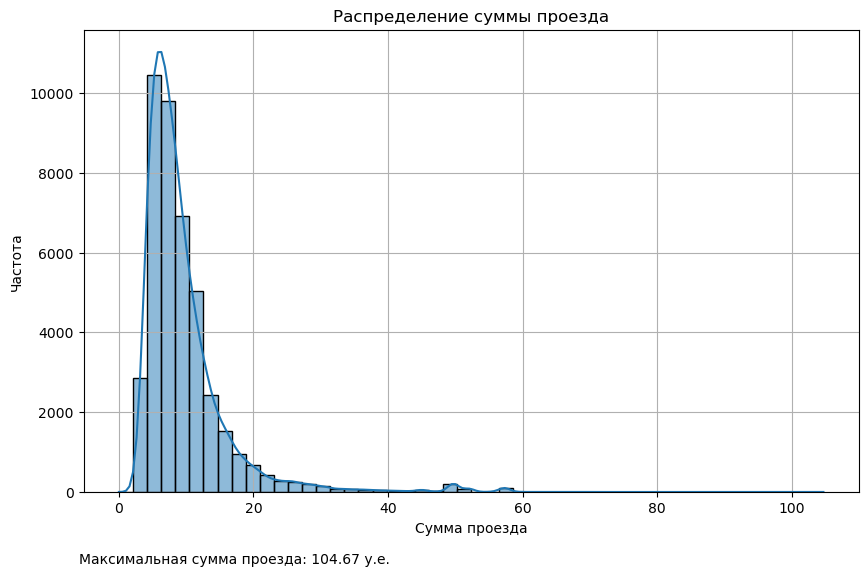

In [12]:
# Создаем гистограмму распределения
plt.figure(figsize=(10, 6))
sns.histplot(df['fare_amount'], bins=50, kde=True)
plt.title('Распределение суммы проезда')
plt.xlabel('Сумма проезда')
plt.ylabel('Частота')
plt.grid()

# Получаем максимальное значение суммы проезда
max_fare_amount = df['fare_amount'].max()

# Добавляем текст под графиком с единицами измерения
plt.figtext(0.12, -0.01, f'Максимальная сумма проезда: {max_fare_amount} у.е.', fontsize=10, ha='left')

# Отображаем график
plt.show()

- Наличие основных значений с низкой стоимостью указывает на то, что большинство поездок происходит в рамках недорогих тарифов. Это может свидетельствовать о высоком числе коротких поездок или поездок на небольшие расстояния.

Временной анализ чтобы увидеть, как сумма проезда изменяется во времени.

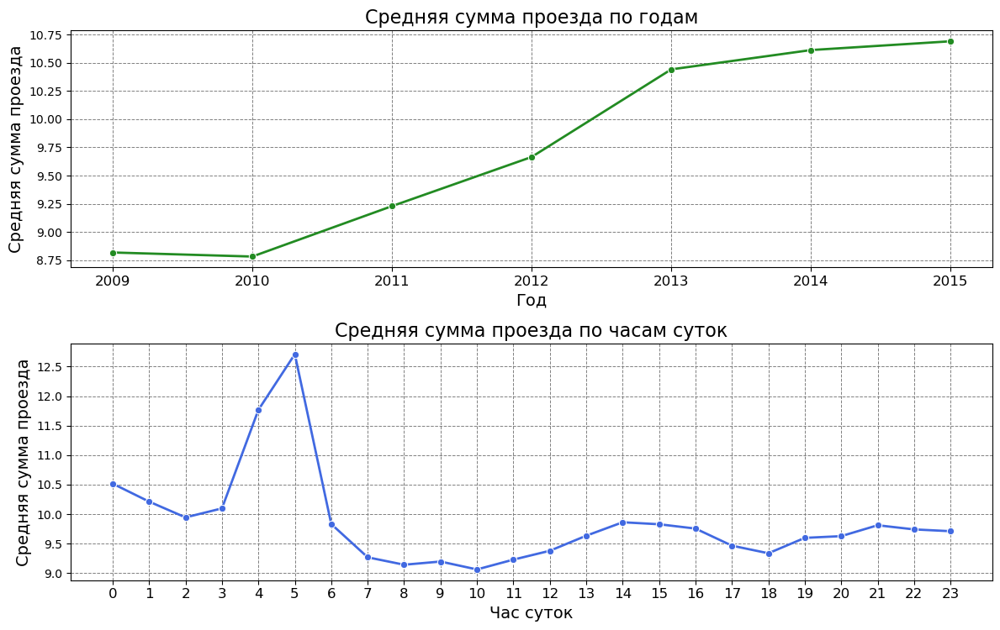

In [13]:
# Группировка по году и расчет среднего тарифа
yearly_fare_avg = df.groupby('year')['fare_amount'].mean().reset_index()  # Группировка по годам и вычисление среднего тарифа

# Группировка по времени и расчет среднего тарифа
hourly_fare_avg = df.groupby('hour')['fare_amount'].mean().reset_index()  # Группировка по часам и вычисление среднего тарифа

# Создание общей фигуры с 2 подграфиками
plt.figure(figsize=(12, 8))

# Первый подграфик: средняя сумма по годам
plt.subplot(2, 1, 1)  # Определяем подграфик (2 строки, 1 колонка, 1-й подграфик)
sns.lineplot(data=yearly_fare_avg, x='year', y='fare_amount', marker='o', color='forestgreen', linestyle='-', linewidth=2)
plt.title('Средняя сумма проезда по годам', fontsize=16)  # Заголовок графика
plt.xlabel('Год', fontsize=14)  # Подпись оси X
plt.ylabel('Средняя сумма проезда', fontsize=14)  # Подпись оси Y
plt.xticks(yearly_fare_avg['year'], fontsize=12)  # Настройка подписей по оси X
plt.grid(color='gray', linestyle='--', linewidth=0.7)  # Добавление сетки с параметрами

# Второй подграфик: средняя сумма по часам суток
plt.subplot(2, 1, 2)  # Определяем подграфик (2 строки, 1 колонка, 2-й подграфик)
sns.lineplot(data=hourly_fare_avg, x='hour', y='fare_amount', marker='o', color='royalblue', linestyle='-', linewidth=2)
plt.title('Средняя сумма проезда по часам суток', fontsize=16)  # Заголовок графика
plt.xlabel('Час суток', fontsize=14)  # Подпись оси X
plt.ylabel('Средняя сумма проезда', fontsize=14)  # Подпись оси Y
plt.xticks(range(24), fontsize=12)  # Настройка подписей по оси X для каждого часа
plt.grid(color='gray', linestyle='--', linewidth=0.7)  # Добавление сетки с параметрами

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Автоматическая оптимизация расстояний между подграфиками
plt.show()  # Отображение графиков

- Есть очевидная тенденция в изменении средней суммы проезда с течением времени. График показывает увеличение суммы, это может свидетельствовать о росте цен на услуги или увеличении спроса. Цены могут расти, чтобы соответствовать общему уровню инфляции в экономике.
- На втором графике максимальная средняя сумма проезда наблюдается в ночные часы, достигая пика около пяти утра. Это может свидетельствовать о высоком спросе на услуги такси в это время.

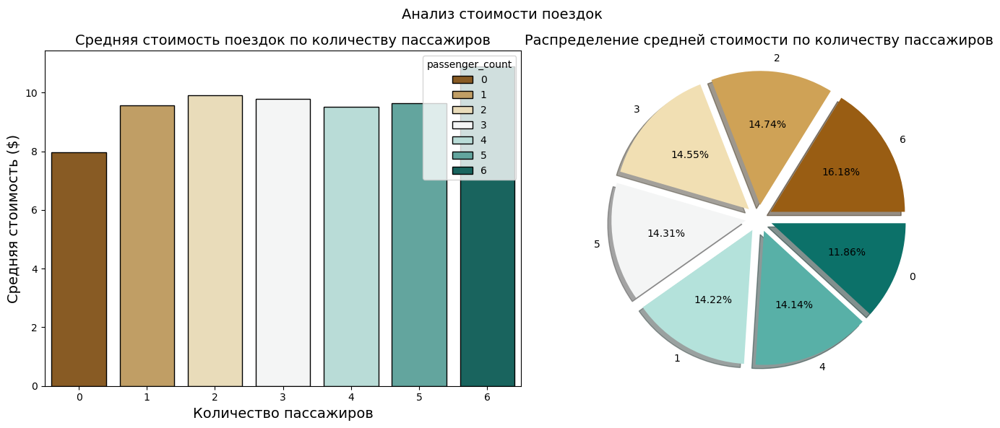

In [14]:
# Группировка данных и расчет среднего тарифа по количеству пассажиров
average_fare = df.groupby('passenger_count')['fare_amount'].mean().reset_index()

# Сортировка данных по средней стоимости
average_fare = average_fare.sort_values(by='fare_amount', ascending=False)

# Создание цветовой палитры для графиков
colors = sns.color_palette("BrBG", len(average_fare))

plt.figure(figsize=(14, 6))  # Определяем размер графика

# Столбчатая диаграмма
plt.subplot(1, 2, 1)  # Создаем подграфик (1 строка, 2 колонки, 1-й график)
sns.barplot(data=average_fare, x='passenger_count', y='fare_amount', 
            palette=colors, edgecolor='black', hue='passenger_count', errorbar=None)
plt.title("Средняя стоимость поездок по количеству пассажиров", fontsize=14)  # Заголовок графика
plt.xlabel('Количество пассажиров', fontsize=14)  # Подпись оси X
plt.ylabel('Средняя стоимость ($)', fontsize=14)   # Подпись оси Y

# Круговая диаграмма (по количеству пассажиров)
plt.subplot(1, 2, 2)  # Создаем второй подграфик
average_fare.set_index('passenger_count')['fare_amount'].plot.pie(
    explode=[0.1] * len(average_fare),  # Взрыв (отступ) для каждого сектора
    autopct='%1.2f%%',  # Формат отображения процентов
    shadow=True,  # Добавление теней
    colors=colors  # Цвета для секторного графика
)

plt.ylabel('')  # Убираем подпись Y
plt.title("Распределение средней стоимости по количеству пассажиров", fontsize=14)  # Заголовок графика

plt.suptitle('Анализ стоимости поездок', fontsize=14)  # Общий заголовок для всего графика
plt.tight_layout()  # Автоматическая настройка параметров подгонки
plt.show()  # Отображение графика

- Вы можете заметить, что средняя стоимость поездки меняется в зависимости от количества пассажиров. Это свидетельствует о том, что общая сумма поездки увеличивается с ростом числа пассажиров, так как они могут разделить стоимость между собой, что делает поездку более выгодной.

Создание интерактивной тепловой карты с центром на усредненных координатах, тепловая карта может дать представление о плотности поездок.

In [15]:
# Проверяем, сколько записей осталось
print("Число записей до фильтрации по Нью-Йорку:", df.shape[0])  # Вывод количества записей в DataFrame

# Создание карты с центром на усредненных координатах (широта и долгота)
m = folium.Map(location=[df['pickup_latitude'].mean(), df['pickup_longitude'].mean()], zoom_start=2)  # Задаем масштаб

# Подготовка данных для тепловой карты
heat_data = [[row['pickup_latitude'], row['pickup_longitude'], row['fare_amount']] for index, row in df.iterrows()]  # Составляем список координат с учетом цены

# Добавление тепловой карты на карту
HeatMap(heat_data, radius=15).add_to(m)  # Добавляем тепловую карту на созданную карту

# Отображение карты
m  # Отображение карты в Jupyter Notebook или в среде, поддерживающей folium

Число записей до фильтрации по Нью-Йорку: 42752


- видим выбросы за пределами города, есть даже в Гвинейском заливе и в Антарктиде, уберем и их

In [16]:
# Фильтрация данных, оставляя только записи в пределах Нью-Йорка
nyc_latitude_bounds = (40.580, 41.200)  # Широтные границы Нью-Йорка
nyc_longitude_bounds = (-74.550, -73.750)  # Долготные границы Нью-Йорка

# Отбор записей, которые попадают в указанные географические пределы
df_nyc = df[
    (df['pickup_latitude'] >= nyc_latitude_bounds[0]) & (df['pickup_latitude'] <= nyc_latitude_bounds[1]) &
    (df['pickup_longitude'] >= nyc_longitude_bounds[0]) & (df['pickup_longitude'] <= nyc_longitude_bounds[1])
]

# Проверяем, сколько записей осталось после фильтрации
print("Число записей после фильтрации по Нью-Йорку:", df_nyc.shape[0])

# Создаем карту, центрированную на среднем местоположении выбранных записей
m = folium.Map(location=[df_nyc['pickup_latitude'].mean(), df_nyc['pickup_longitude'].mean()], zoom_start=10)

# Подготовка данных для тепловой карты: создаем список координат и значений тарифа
heat_data = [[row['pickup_latitude'], row['pickup_longitude'], row['fare_amount']] for index, row in df_nyc.iterrows()]

# Добавление тепловой карты на карту с заданным радиусом
HeatMap(heat_data, radius=15).add_to(m)  

# Отображение карты
display(m)  # Используем display() для отображения интерактивной карты

Число записей после фильтрации по Нью-Йорку: 42723


4.      - Проверьте гипотезы (если потребуется)

In [17]:
alpha = 0.05  # уровень значимости

ANOVA (Analysis of Variance, анализ дисперсии) — это статистический метод, используемый для сравнения средних значений двух или более групп и определения, есть ли статистически значимые различия между ними.

1. Гипотеза для первого теста (ANOVA по количеству пассажиров в зависимости от недели):

- Нулевая гипотеза (H0): Нет различий в среднем количестве пассажиров между неделями. 
- Альтернативная гипотеза (H1): Существует разница в среднем количестве пассажиров между неделями.

In [18]:
# 1. Выполнение ANOVA-теста по количеству пассажиров в зависимости от недели
groups = df.groupby('passenger_count')['week'].apply(list).values
f_statistic, p_value = stats.f_oneway(*groups)

# Вывод результатов
print(f"ANOVA для количества пассажиров по неделям:")
print(f"F-Statistic: {f_statistic:.2f}, P-Value: {p_value:.4f}")

# Интерпретация результата
if p_value < alpha:
    print("Отвергаем нулевую гипотезу: Существует разница в среднем количестве пассажиров в зависимости от недели.")
else:
    print("Не отвергаем нулевую гипотезу: Нет значимой разницы в среднем количестве пассажиров в зависимости от недели.")

ANOVA для количества пассажиров по неделям:
F-Statistic: 2.79, P-Value: 0.0102
Отвергаем нулевую гипотезу: Существует разница в среднем количестве пассажиров в зависимости от недели.


2. Гипотеза для второго теста (ANOVA по неделям):

- Нулевая гипотеза (H0): Количество пассажиров не зависит от недели; в среднем, количество пассажиров не отличается между неделями.
- Альтернативная гипотеза (H1): Количество пассажиров зависит от недели; в среднем, количество пассажиров отличается между неделями.

In [19]:
# 2. Выполнение ANOVA-теста по неделям
groups = [group['passenger_count'].values for _, group in df.groupby('week')]
f_statistic, p_value = stats.f_oneway(*groups)

# Вывод результатов
print(f"\nANOVA для недель по количеству пассажиров:")
print(f"F-Statistic: {f_statistic:.2f}, P-Value: {p_value:.4f}")

# Интерпретация результата

if p_value < alpha:
    print("Отвергаем нулевую гипотезу: Существует разница в количестве пассажиров в зависимости от недели.")
else:
    print("Не отвергаем нулевую гипотезу: Нет значимой разницы в количестве пассажиров в зависимости от недели.")


ANOVA для недель по количеству пассажиров:
F-Statistic: 1.11, P-Value: 0.2688
Не отвергаем нулевую гипотезу: Нет значимой разницы в количестве пассажиров в зависимости от недели.


Эти два теста подчеркивают важные аспекты в данных:

- Первый тест показывает, что существует значимая разница в среднем количестве пассажиров в зависимости от недели. Это может указывать на то, что определенные недели могут быть связаны с изменениями в количестве пассажиров из-за сезонных колебаний или других факторов.

- Второй тест показывает, что в среднем между неделями не наблюдается значительных различий в количестве пассажиров. Это может указывать на стабильный поток пассажиров в течение разных недель, несмотря на наличие колебаний в определенные периоды.

Таким образом, результаты исследований подчеркивают, что, хотя в определенные недели могут происходить значительные изменения в количестве пассажиров, в целом поток пассажиров остается предсказуемым и стабильным в зависимости от недели.

In [20]:
df_nyc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42723 entries, 0 to 49998
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype              
---  ------             --------------  -----              
 0   key                42723 non-null  object             
 1   fare_amount        42723 non-null  float64            
 2   pickup_datetime    42723 non-null  datetime64[ns, UTC]
 3   pickup_longitude   42723 non-null  float64            
 4   pickup_latitude    42723 non-null  float64            
 5   dropoff_longitude  42723 non-null  float64            
 6   dropoff_latitude   42723 non-null  float64            
 7   passenger_count    42723 non-null  int64              
 8   hour               42723 non-null  int32              
 9   day_of_week        42723 non-null  int32              
 10  month              42723 non-null  int32              
 11  year               42723 non-null  int32              
 12  week               42723 non-null  UInt32          

5.     - Сделайте промежуточный отчет-вывод по исследованию

На текущем этапе анализа данных о поездках на такси мы провели ряд шагов, направленных на извлечение значимой информации из имеющихся данных. 

 Преобразование временных данных:
   - Время pickup_datetime было преобразовано в формат datetime, что позволило извлечь дополнительные признаки, такие как час и день недели. Это дало возможность более глубоко проанализировать, как время суток и день недели влияют на стоимость поездок.
   - На основании этих признаков были построены графики, показывающие зависимость средней стоимости поездок от дня недели и времени суток.

 Расчет расстояния поездки:
   - Была создана функция для вычисления расстояния между начальной и конечной точками поездки с использованием географических координат (широта и долгота). Это позволило добавить новую переменную — travel_dist_km (дальность перемещения в км).
   - На данных о расстоянии были построены точечные графики, которые показали распределение стоимости в зависимости от пройденного расстояния. Были удалены выбросы, что позволит улучшить качество анализа при построении моделей.

 Визуализация на карте:
   - С использованием библиотеки Folium была создана интерактивная карта с центром на усредненных координатах г. Нью-Йорка. Это позволило визуализировать маршруты поездок и распределение данных по территории города.
   - В процессе анализа были выявлены ошибки в координатах (широта и долгота), которые выходили за пределы допустимых значений. Эти данные были отфильтрованы, чтобы оставить только корректные записи, находящиеся в пределах географических границ Нью-Йорка.

6.     - Определите, какую задачу вы будете решать (классификация, регрессия и т.д.)

- Задача предсказания нашего таргета <span style="color: orange; font-weight: bold;">fare_amount</span> является задачей регрессии. Нам необходимо предсказать непрерывное значение (стоимость), что делает подход регрессии наиболее подходящим для данной задачи.

7.     - Создайте несколько моделей для прогнозирования вашего целевого признака и выберите наилучшую, опираясь на вашу валидацию

Для решения задачи регрессии по предсказанию стоимости поездки (fare_amount) мы будем использовать модели:

- Последовательная нейронная сеть (Sequential Neural Network): Эта модель будет использоваться для глубокого обучения и обучения на нелинейных зависимостях в данных, что может помочь в более точном предсказании стоимости поездки.
- Линейная регрессия (Linear Regression): Простая модель, которая предполагает линейную зависимость между входными признаками и целевой переменной.
- Дерево решений (Decision Tree Regressor): Модель, которая разбивает данные на регионы, основываясь на значениях признаков, чтобы предсказать значения целевой переменной.
- Случайный лес (Random Forest Regressor): Ансамблевая модель, которая использует несколько деревьев решений и объединяет их предсказания для повышения точности.
- XGBoost (XGBoost Regressor): Современная и мощная модель градиентного бустинга, популярная благодаря своей высокой эффективности и способности работать с разными типами данных.

8.     - Сделайте прогноз для тестовой выборки (должно быть три выборки в этой задаче: тренировочная, валидационная, тестовая)

- Обучение модели и оценка

   - Тренировочная выборка (features_train, target_train): используется для обучения модели.
   - Валидационная выборка (features_val, target_val): используется для настройки гиперпараметров и предотвращения переобучения, обеспечивая оценку качества модели во время обучения.
   - Тестовая выборка (features_test, target_test): используется для окончательной оценки модели после завершения обучения, чтобы проверить, насколько хорошо модель может обобщать новые, невидимые данные.

- В результате у нас получится:

   - Тренировочная выборка: 70% от всех данных — используется для обучения модели.
   - Валидационная выборка: 15% от всех данных — используется для настройки модели и проверки ее согласованности.
   - Тестовая выборка: 15% от всех данных — используется для окончательной оценки модели.

Epoch 1/1024
56/59 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 112.2390 - mean_squared_error: 109.4871
Epoch 1: val_loss improved from inf to 109.53480, saving model to z_best_model.keras
59/59 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 111.4971 - mean_squared_error: 108.7452 - val_loss: 109.5348 - val_mean_squared_error: 106.7968
Epoch 2/1024
58/59 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 83.5245 - mean_squared_error: 80.7985
Epoch 2: val_loss improved from 109.53480 to 84.87658, saving model to z_best_model.keras
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 83.3720 - mean_squared_error: 80.6464 - val_loss: 84.8766 - val_mean_squared_error: 82.1886
Epoch 3/1024
58/59 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 63.1950 - mean_squared_error: 60.5185
Epoch 3: val_loss improved from 84.87658 to 53.71990, saving model to z_best_model.keras
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 63.0334 - mean_squared_error: 60.3572 - val_loss: 53.7199 - val_mean_squared_error: 51.0786
Epoch 4/1024

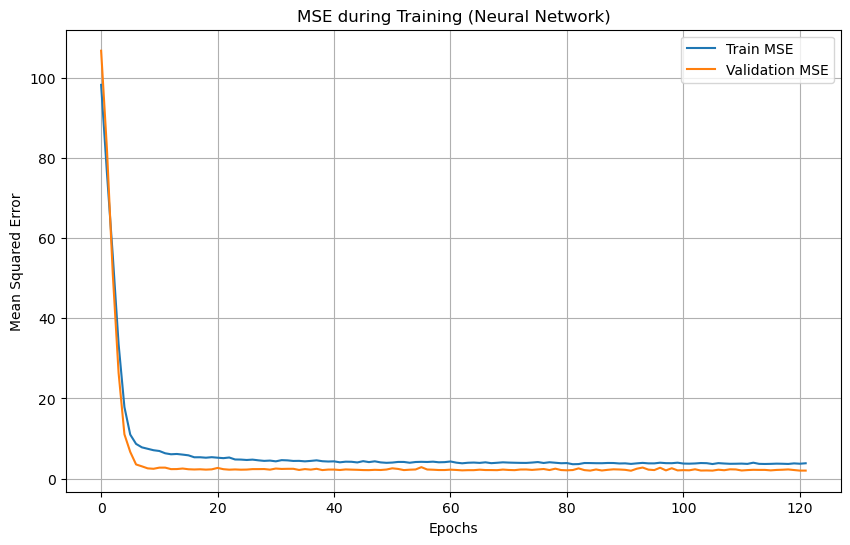

In [21]:
# Определяем признаки и целевую переменную
X = df_nyc.drop(['fare_amount', 'key', 'pickup_datetime'], axis=1)  # Убираем ненужные столбцы
y = df_nyc['fare_amount']  # Целевая переменная

# Определяем числовые признаки
numerical_cols = X.select_dtypes(include=['float64', 'int64', 'int32']).columns.tolist()  # Список числовых столбцов

# Создаем преобразователь для числовых признаков
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols)  # Стандартизируем числовые признаки
    ]
)

# Преобразуем данные
X_processed = preprocessor.fit_transform(X)

# Шаг 1: Делим данные на тренировочную (70%) и временную выборку (30%)
features_train, features_temp, target_train, target_temp = train_test_split(
    X_processed, y, test_size=0.3, random_state=42  # 70% - тренировочная, 30% - временная
)

# Шаг 2: Делим временную выборку на валидационную (15%) и тестовую (15%) (50% от временной выборки)
features_val, features_test, target_val, target_test = train_test_split(
    features_temp, target_temp, test_size=0.5, random_state=42  # 50% - валидационная, 50% - тестовая
)

def create_dense_layers(model, layer_configs):
    # Создаем плотные слои в модели
    for units in layer_configs:
        model.add(Dense(units, activation='relu', kernel_regularizer='l2'))  # Добавляем полносвязный слой
        model.add(BatchNormalization())  # Нормализация слоев
        model.add(Dropout(0.3))  # Используем Dropout для регуляризации

def generate_model(input_shape):
    # Генерируем модель нейронной сети
    model = Sequential()
    model.add(Input(shape=(input_shape,)))  # Указываем входной размер

    create_dense_layers(model, [256, 128, 64])  # Добавляем слои
    model.add(Dense(1))  # Выходной слой

    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_squared_error'])  # Компилируем модель
    return model

def compute_metrics(true_values, predictions):
    # Вычисляем различные метрики
    mse = mean_squared_error(true_values, predictions)  # Среднеквадратичная ошибка
    mae = mean_absolute_error(true_values, predictions)  # Средняя абсолютная ошибка
    r2 = r2_score(true_values, predictions)  # Коэффициент детерминации
    rmse = mse ** 0.5  # Корень из среднеквадратичной ошибки
    mape = np.mean(np.abs((true_values - predictions) / true_values)) * 100  # Средняя абсолютная процентная ошибка
    return mse, mae, r2, rmse, mape

def plot_history(history):
    # Визуализируем историю обучения
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['mean_squared_error'], label='Train MSE')  # Ошибка на тренировочной выборке
    plt.plot(history.history['val_mean_squared_error'], label='Validation MSE')  # Ошибка на валидационной выборке
    plt.title('MSE during Training (Neural Network)')  # Заголовок графика
    plt.xlabel('Epochs')  # По оси X - количество эпох
    plt.ylabel('Mean Squared Error')  # По оси Y - среднеквадратичная ошибка
    plt.legend()  # Легенда графика
    plt.grid()  # Сетка
    plt.show()  # Показать график

# Обучение модели
model = generate_model(features_train.shape[1])  # Генерация модели

callbacks = [
    EarlyStopping(monitor='val_loss', patience=30, verbose=1, mode='min', restore_best_weights=True),  # Колбэк остановки
    ModelCheckpoint('z_best_model.keras', monitor='val_loss', save_best_only=True, mode='min', verbose=1)  # Колбэк сохранения модели
]

# Обучение модели
history = model.fit(features_train, target_train,
                    validation_data=(features_val, target_val),
                    epochs=1024,

                    batch_size=512,
                    callbacks=callbacks)

# Прогнозирование и метрики
y_pred_nn = model.predict(features_test).ravel()  # Прогнозирование
mse_nn, mae_nn, r2_nn, rmse_nn, mape_nn = compute_metrics(target_test, y_pred_nn)  # Вычисление метрик

# Создание словаря с результатами
results_nn = {
    "Метрика": ["MSE", "MAE", "R²", "RMSE", "MAPE"],  # Названия метрик
    "Значение": [
        f"{mse_nn:.4f}",  # Значение MSE
        f"{mae_nn:.4f}",  # Значение MAE
        f"{r2_nn:.4f}",   # Значение R²
        f"{rmse_nn:.4f}", # Значение RMSE
        f"{mape_nn:.4f}%" # Значение MAPE
    ]
}

# Преобразование в DataFrame
nn_results_df = pd.DataFrame(results_nn)  # Создание DataFrame из словаря

# Вывод результатов
print(nn_results_df)  # Печать таблицы с результатами

# Визуализация результатов обучения
plot_history(history)  # Визуализация истории обучения

9.     - Приведите метрику, с помощью которой вы будете оценивать работу вашей модели (обоснуйте ваш выбор метрики)

Для нейронных сетей отлично подходит использование Среднеквадратической ошибки (MSE). Это связано с тем, что MSE:
- Чувствительна к большим ошибкам, что может быть полезно, если вам важно минимизировать крупные отклонения.
- Легко использовать в процессе обучения, особенно если вы используете алгоритмы градиентного спуска, так как MSE является дифференцируемой функцией.

Однако, также можно рассматривать Среднюю абсолютную ошибку (MAE) для случаев, когда:
- Данные имеют выбросы, так как MAE менее чувствительна к ним по сравнению с MSE.

In [22]:
# Создаем модели и параметры для GridSearchCV
models = {  # Словарь моделей для использования
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'XGBoost': XGBRegressor()
}

# Определение сеток гиперпараметров для каждой модели
param_grids = {
    'Linear Regression': {},  # Для линейной регрессии нет гиперпараметров
    'Decision Tree': {
        'min_samples_leaf': [10, 50, 100]  # Параметры для дерева решений
    },
    'Random Forest': {
        'n_estimators': [10, 50, 100],  # Количество деревьев
        'min_samples_split': [2, 5, 10]  # Минимальное количество образцов для разбиения
    },
    'XGBoost': {
        'n_estimators': [10, 50, 100, 200],  # Количество деревьев
        'learning_rate': [0.01, 0.1, 0.2]  # Скорость обучения
    }
}

# Словарь для хранения лучших моделей и метрик
best_models = {}
results = {}

# Обучение и оценка моделей с использованием GridSearchCV
for name, model in models.items():
    print(f"Настройка гиперпараметров для {name}")

    # GridSearchCV для каждой модели с 5-кратной перекрестной проверкой
    grid_search = GridSearchCV(model, param_grid=param_grids[name], scoring='neg_mean_squared_error', cv=5, n_jobs=-1)
    
    # Обучаем модель с использованием тренировочных данных
    grid_search.fit(features_train, target_train)

    # Сохраняем лучшую модель из GridSearch
    best_models[name] = grid_search.best_estimator_

    # Предсказания на валидационном и тестовом наборах данных
    preds_val = best_models[name].predict(features_val)
    preds_test = best_models[name].predict(features_test)

    # Вычисляем метрики для валидации и тестирования
    mse_val, mae_val, r2_val, rmse_val, mape_val = compute_metrics(target_val, preds_val)
    mse_test, mae_test, r2_test, rmse_test, mape_test = compute_metrics(target_test, preds_test)

    # Сохраняем результаты в словаре
    results[name] = {
        'Validation MSE': mse_val,
        'Validation MAE': mae_val,
        'Validation RMSE': rmse_val,
        'Validation R²': r2_val,
        'Validation MAPE': mape_val,
        'Test MSE': mse_test,
        'Test MAE': mae_test,
        'Test RMSE': rmse_test,
        'Test R²': r2_test,
        'Test MAPE': mape_test,
        'Best Params': grid_search.best_params_
    }

    # Выводим результаты для текущей модели
    print(f"Лучшие параметры для {name}: {grid_search.best_params_}")
    print(f"MSE (Validation): {mse_val:.4f}, MAE (Validation): {mae_val:.4f}, "
          f"RMSE (Validation): {rmse_val:.4f}, MAPE (Validation): {mape_val:.4f}%")
    print(f"MSE (Test): {mse_test:.4f}, MAE (Test): {mae_test:.4f}, "
          f"RMSE (Test): {rmse_test:.4f}, R² (Test): {r2_test:.4f}, "
          f"MAPE (Test): {mape_test:.4f}%\n")

Настройка гиперпараметров для Linear Regression
Лучшие параметры для Linear Regression: {}
MSE (Validation): 2.6863, MAE (Validation): 1.2617, RMSE (Validation): 1.6390, MAPE (Validation): 14.8137%
MSE (Test): 2.8984, MAE (Test): 1.3124, RMSE (Test): 1.7025, R² (Test): 0.9421, MAPE (Test): 15.0544%

Настройка гиперпараметров для Decision Tree
Лучшие параметры для Decision Tree: {'min_samples_leaf': 50}
MSE (Validation): 2.6095, MAE (Validation): 1.2324, RMSE (Validation): 1.6154, MAPE (Validation): 14.5226%
MSE (Test): 2.8471, MAE (Test): 1.2803, RMSE (Test): 1.6873, R² (Test): 0.9431, MAPE (Test): 14.7508%

Настройка гиперпараметров для Random Forest
Лучшие параметры для Random Forest: {'min_samples_split': 2, 'n_estimators': 100}
MSE (Validation): 2.2371, MAE (Validation): 1.1390, RMSE (Validation): 1.4957, MAPE (Validation): 13.5878%
MSE (Test): 2.4197, MAE (Test): 1.1810, RMSE (Test): 1.5555, R² (Test): 0.9517, MAPE (Test): 13.7621%

Настройка гиперпараметров для XGBoost
Лучшие пар

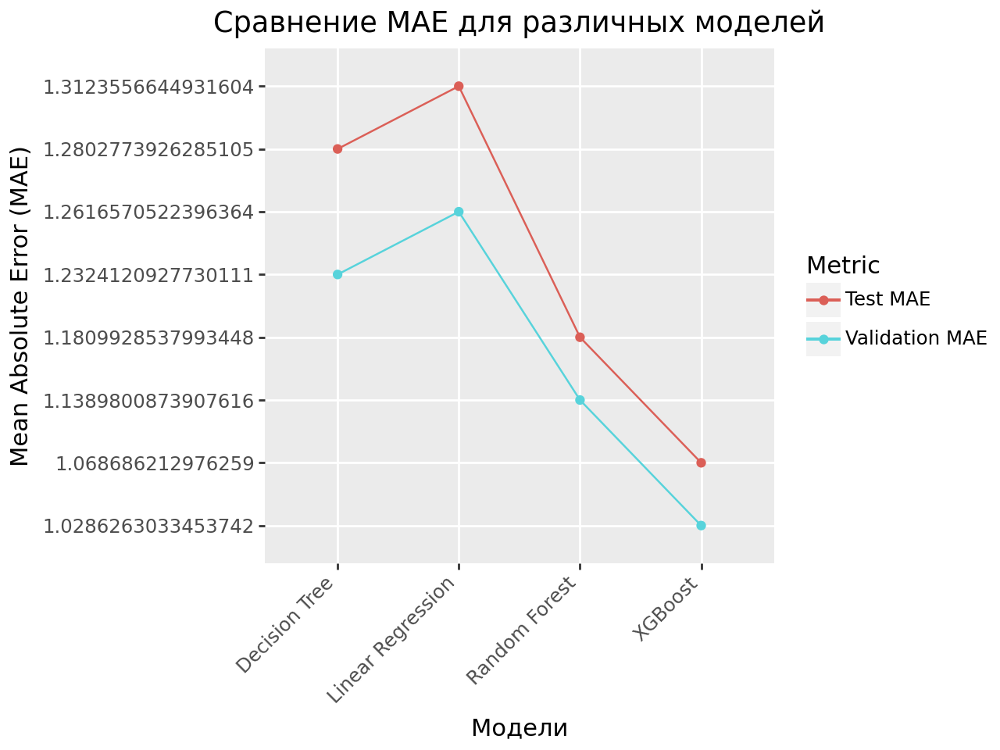

In [23]:
# Создание DataFrame для визуализации результатов
results_df = pd.DataFrame(results).T  # Транспонируем DataFrame, чтобы строки стали столбцами метрик

# Подготовка данных для визуализации
results_long = results_df.reset_index().melt(id_vars='index', value_vars=['Validation MAE', 'Test MAE'], 
                                               var_name='Metric', value_name='MAE')  
# Преобразование в длинный формат для удобства визуализации: 'index' - название модели, 'Metric' - тип метрики, 'MAE' - значение

# Построение графика с использованием Plotnine (графическая библиотека на основе ggplot2)
p = (ggplot(results_long, aes(x='index', y='MAE', color='Metric')) +  # Настройка осей и цветов
        geom_line(aes(group='Metric')) +  # Линии, соединяющие точки для каждой метрики
        geom_point() +  # Добавление точек на график
        labs(title='Сравнение MAE для различных моделей', x='Модели', y='Mean Absolute Error (MAE)') +  # Заголовок и метки осей
        theme(axis_text_x=element_text(angle=45, hjust=1))  # Угол наклона подписям по оси x
)

# Отображение графика
p.show()  # Отображение результата графика

10.     - Сделайте вывод о работе вашей модели и метриках. Обоснуйте: «Нужно ли использовать для решения этой задачи машинное обучение или можно обойтись dummy-предсказанием?»

In [24]:
# Сравнение результатов с нейронной сетью
comparison = {
    "Метрика": ["MSE", "MAE", "RMSE", "R²", "MAPE"],  # Названия метрик для сравнения
    "Нейронная сеть": [mse_nn, mae_nn, rmse_nn, r2_nn, mape_nn],  # Результаты нейронной сети
    "Linear Regression": [  # Результаты для линейной регрессии
        results['Linear Regression']['Test MSE'],
        results['Linear Regression']['Test MAE'],
        results['Linear Regression']['Test RMSE'],
        results['Linear Regression']['Test R²'],
        results['Linear Regression']['Test MAPE'],
    ],
    "Decision Tree": [  # Результаты для дерева решений
        results['Decision Tree']['Test MSE'],
        results['Decision Tree']['Test MAE'],
        results['Decision Tree']['Test RMSE'],
        results['Decision Tree']['Test R²'],
        results['Decision Tree']['Test MAPE'],
    ],
    "Random Forest": [  # Результаты для случайного леса
        results['Random Forest']['Test MSE'],
        results['Random Forest']['Test MAE'],
        results['Random Forest']['Test RMSE'],
        results['Random Forest']['Test R²'],
        results['Random Forest']['Test MAPE'],
    ],
    "XGBoost": [  # Результаты для XGBoost
        results['XGBoost']['Test MSE'],
        results['XGBoost']['Test MAE'],
        results['XGBoost']['Test RMSE'],
        results['XGBoost']['Test R²'],
        results['XGBoost']['Test MAPE'],
    ],
}

# Создание DataFrame для сравнения метрик
comparison_df = pd.DataFrame(comparison)

# Печать результатов в виде таблицы с использованием tabulate для лучшего форматирования
print(tabulate(comparison_df, headers='keys', tablefmt='psql', showindex=False, stralign='center', numalign='center'))

+-----------+------------------+---------------------+-----------------+-----------------+-----------+
|  Метрика  |  Нейронная сеть  |  Linear Regression  |  Decision Tree  |  Random Forest  |  XGBoost  |
|-----------+------------------+---------------------+-----------------+-----------------+-----------|
|    MSE    |     2.08335      |       2.8984        |     2.84715     |     2.4197      |  2.12997  |
|    MAE    |     1.06883      |       1.31236       |     1.28028     |     1.18099     |  1.06869  |
|   RMSE    |     1.44338      |       1.70247       |     1.68735     |     1.55554     |  1.45944  |
|    R²     |     0.958373     |      0.942088       |    0.943112     |    0.951653     | 0.957442  |
|   MAPE    |     12.1669      |       15.0544       |     14.7508     |     13.7621     |  12.3311  |
+-----------+------------------+---------------------+-----------------+-----------------+-----------+


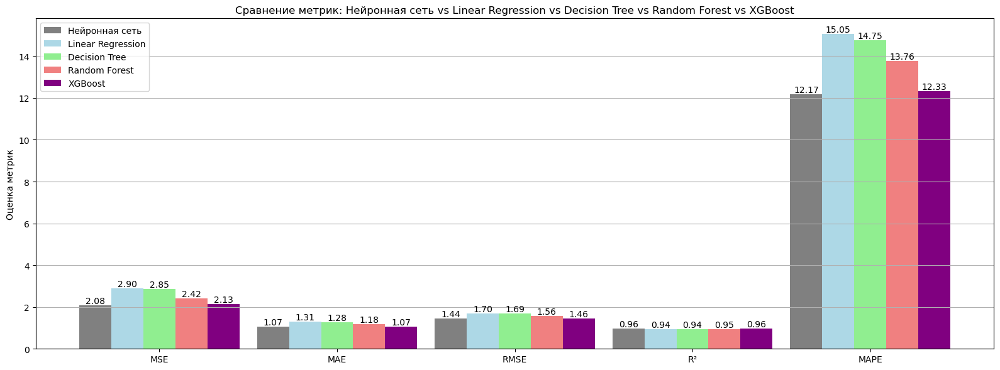

In [25]:
# Настройка графика
metrics = ["MSE", "MAE", "RMSE", "R²", "MAPE"]  # Названия метрик для оси x

# Извлечение значений для каждой модели и округление до 2-х знаков
nn_scores = np.round(comparison_df.iloc[:, 1].values, 2)  # Нейронная сеть
lr_scores = np.round(comparison_df.iloc[:, 2].values, 2)  # Линейная регрессия
dt_scores = np.round(comparison_df.iloc[:, 3].values, 2)  # Дерево решений
rfr_scores = np.round(comparison_df.iloc[:, 4].values, 2)  # Случайный лес
xgbr_scores = np.round(comparison_df.iloc[:, 5].values, 2)  # XGBoost

# Настройка данных для группировки
x = np.arange(len(metrics))  # Генерация чисел от 0 до количества метрик для оси x
width = 0.18  # Ширина столбцов для графика

fig, ax = plt.subplots(figsize=(16, 6))  # Создание фигуры и осей с увеличенными размерами

# Создание столбцов для каждой модели
bars1 = ax.bar(x - 2 * width, nn_scores, width, label='Нейронная сеть', color='gray')  # Столбцы для нейронной сети
bars2 = ax.bar(x - width, lr_scores, width, label='Linear Regression', color='lightblue')  # Столбцы для линейной регрессии
bars3 = ax.bar(x, dt_scores, width, label='Decision Tree', color='lightgreen')  # Столбцы для дерева решений
bars4 = ax.bar(x + width, rfr_scores, width, label='Random Forest', color='lightcoral')  # Столбцы для случайного леса
bars5 = ax.bar(x + 2 * width, xgbr_scores, width, label='XGBoost', color='purple')  # Столбцы для XGBoost

# Добавление подписей к осям и заголовка
ax.set_ylabel('Оценка метрик')
ax.set_title('Сравнение метрик: Нейронная сеть vs Linear Regression vs Decision Tree vs Random Forest vs XGBoost')
ax.set_xticks(x)  # Установка меток на оси x
ax.set_xticklabels(metrics)  # Подписи для оси x
ax.legend()  # Добавление легенды
ax.grid(axis='y')  # Добавление сетки по оси y для лучшей визуализации

# Подпись значений над столбцами
for bars in [bars1, bars2, bars3, bars4, bars5]:
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), 
                f"{round(bar.get_height(), 2):.2f}", ha='center', va='bottom')  # Подписи значений над каждым столбцом

plt.tight_layout()  # Автоматическая настройка макета графика
plt.show()  # Отображение графика

### Вывод о работе модели и метриках

Исходя из представленных метрик, можно сделать следующие выводы относительно производительности моделей и обоснованности использования машинного обучения:

1. Метрики качества:
   - MSE (Mean Squared Error): Значение MSE для нейронной сети составило 2.08335, что указывает на приемлемую степень точности в предсказаниях. Другие модели, такие как XGBoost (2.12997) и случайный лес (2.4197), также показывают сопоставимые результаты, но имеют более высокие значения MSE.
   - MAE (Mean Absolute Error): Нейронная сеть имеет значение MAE 1.06883, что ниже, чем у линейной регрессии (1.31236) и дерева решений (1.28028). Это говорит о более точных предсказаниях для большинства данных.
   - RMSE (Root Mean Squared Error): Этот показатель близок к MSE и демонстрирует эффективные результаты, особенно для нейронной сети (1.44338).
   - R² (Coefficient of Determination): Значение R² для нейронной сети составляет 0.958373, что указывает на то, что модель объясняет 95.84% вариации в данных. Это высокий коэффициент, свидетельствующий о хорошей подгонке модели к данным.
   - MAPE (Mean Absolute Percentage Error): Нейронная сеть показывает процент ошибки 12.1669%, что может считаться приемлемым значением в большинстве сценариев.

По всем метрикам (MSE, MAE, RMSE, R² и MAPE) наилучшие результаты показывает нейронная сеть. Это свидетельствует о том, что она является наиболее эффективной моделью из представленных для данной задачи.

2. Обоснование использования машинного обучения:
   - На основе представленных метрик значительное превосходство моделей (особенно нейронной сети и XGBoost) над линейной регрессией и другими простыми методами предсказания указывает на то, что эти модели способны лучше справляться с задачей предсказания, чем простое "dummy-предсказание" (например, предсказание на уровне среднего значения).
   - Dummy-предсказание обычно служит в качестве базовой линии и предоставляет менее точные результаты, особенно в сложных задачах, где присутствует значительная вариабельность в целевой переменной.
   - Поскольку R² для нейронной сети составляет 0.958373, использование машинного обучения обосновано тем, что оно значительно улучшает качество предсказаний по сравнению с простыми подходами.

### Заключение:
С учетом всех вышеперечисленных факторов можно сделать вывод, что для решения данной задачи использование машинного обучения является обоснованным и целесообразным. Ожидается, что модели, особенно современные алгоритмы, такие как нейронные сети и XGBoost, будут значительно точнее, чем традиционные методы и dummy-предсказания.

